In [276]:
#collect all time points for one cancer type and perform clustering analysis

# libraries

In [277]:
import patientClassFunctions as ptfn
import numpy as np
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import os
# import seaborn as sns
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [278]:
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from scipy import sparse
from community import community_louvain
import community
from collections import defaultdict
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics import mutual_info_score, adjusted_rand_score

# directory management

In [279]:
computer_path_header = "C:\\Users\\maega"
# computer_path_header = "C:\\Users\\mcremer"
folder_path2= "UFL Dropbox\\Maegan Cremer\\BTO-data"
folder_path_processed = "012_Processed_Data"
path_ptdata = os.path.join(computer_path_header, folder_path2, folder_path_processed, "patient_files")
os.chdir(path_ptdata)

# file importing and patient class

In [280]:
#importing patient data as dictionaries of dataframes

#build a dictionary of patients and their values 
ptFiles = ptfn.GetListofPTfiles(path_ptdata, '.xlsx', 'BTO')

ptDict = {}

#loop through the listOfPatients 
for file in ptFiles: 
    pt = ptfn.patient(path_ptdata, file, 7)
    ptDict[pt.ptID] = pt

BTO-002 no patient identifying information
BTO-051 no patient identifying information
BTO-081 no patient identifying information


# collecting the data

In [281]:
#the primary tumor type of interest
#1, Esophagogastric | 2, HCC | 3, Biliary Tract | 4, Pancreatic | 5, Colorectal | 6, Anal | 7, NET | 8, Other GI cancer
primaryOfinterest = 4 #some integer as described above

In [282]:
# test_primary = {}
methylationDict = {}

primarytumorEnrollementDict = {}

metEnrollmentDict = {}
metEnrollmentPresence = {}

NSRdict = {}

for ptID in ptDict.keys():
    ptdata = ptDict[ptID]
    if ptdata.methylationSignatures is not False and ptdata.ptDemographics is not False:
        if ptdata.primarytumor == 4:
            methylationDict[ptID] = ptdata.methylationSignatures #all time points
            primarytumorEnrollementDict[ptID]= ptdata.primarytumorEnrollment #binary if primary tumor is present at enrollment
            metEnrollmentDict[ptID] = ptdata.metEnrollmentList #numeric list of locations of mets at enrollment 
            metEnrollmentPresence[ptID] = ptdata.metsAtEnrollment #length of met sites
            NSRdict[ptID] = ptdata.NSR

print(len(methylationDict.keys()))

13


In [283]:
metEnrollmentDict


{'BTO-018': [2],
 'BTO-022': [1],
 'BTO-035': [5],
 'BTO-038': [1],
 'BTO-042': [1],
 'BTO-053': [2, 3, 6],
 'BTO-082': [1],
 'BTO-108': [1, 3, 5],
 'BTO-121': [1, 4, 5],
 'BTO-122': [1, 2, 4, 5],
 'BTO-125': [2],
 'BTO-131': [1, 2, 4, 5],
 'BTO-134': [1]}

In [284]:
metsLongDict = {}
for ptID in metEnrollmentDict.keys():
    mets = metEnrollmentDict[ptID]
    if len(mets) > 0:
        mets_new = [x if x in mets else 0 for x in range(1,7)]
    elif len(mets) == 0:
        mets_new = [0 for x in range(1,7)]
    metsLongDict[ptID] = mets_new

metsLongDict        

{'BTO-018': [0, 2, 0, 0, 0, 0],
 'BTO-022': [1, 0, 0, 0, 0, 0],
 'BTO-035': [0, 0, 0, 0, 5, 0],
 'BTO-038': [1, 0, 0, 0, 0, 0],
 'BTO-042': [1, 0, 0, 0, 0, 0],
 'BTO-053': [0, 2, 3, 0, 0, 6],
 'BTO-082': [1, 0, 0, 0, 0, 0],
 'BTO-108': [1, 0, 3, 0, 5, 0],
 'BTO-121': [1, 0, 0, 4, 5, 0],
 'BTO-122': [1, 2, 0, 4, 5, 0],
 'BTO-125': [0, 2, 0, 0, 0, 0],
 'BTO-131': [1, 2, 0, 4, 5, 0],
 'BTO-134': [1, 0, 0, 0, 0, 0]}

In [285]:
for ptID in NSRdict:
    print(ptID, len(NSRdict[ptID]))

BTO-018 4
BTO-022 7
BTO-035 12
BTO-038 9
BTO-042 5
BTO-053 3
BTO-082 1
BTO-108 5
BTO-121 2
BTO-122 4
BTO-125 19
BTO-131 6
BTO-134 8


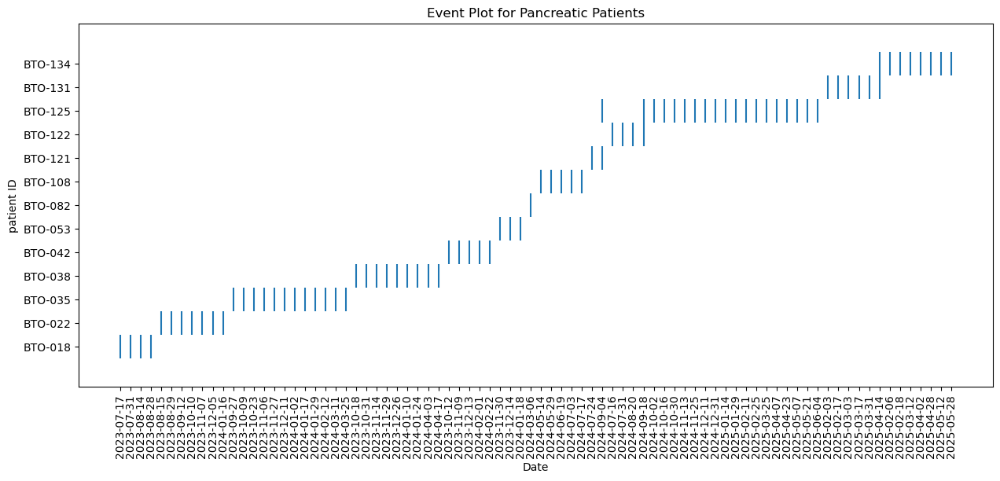

In [286]:
eventplot_data = {ptID: NSRdict[ptID]['collection_date'].values.flatten() for ptID in NSRdict}
fig, ax = plt.subplots(figsize=(15, 6))
ax.eventplot(eventplot_data.values(), lineoffsets =1)
ax.set_title('Event Plot for Pancreatic Patients')
ax.set_xlabel('Date')
ax.set_ylabel('patient ID')
#make the x-axis labels vertical
ax.tick_params(axis='x', rotation=90)
yaxislabels = [ptID for ptID in eventplot_data.keys()]
ax.set_yticks(np.arange(0, len(yaxislabels), 1), yaxislabels, rotation = 'horizontal')
plt.show()

In [287]:
methylationDict

{'BTO-018':      Unnamed: 0  10_q24.2_1  8_q21.3_1  1_p13.3_1  10_q22.1_1  11_q25_1  \
 0  NS1035CR0041           0   0.550604          0           0         0   
 1  NS1035CR0015           0   0.000000          0           0         0   
 2  NS1035CR0024           0   0.000000          0           0         0   
 
    12_q24.33_1  15_q21.1_1  15_q26.3_1  16_p13.3_2  ...  8_q24.22_12  \
 0            0           0    0.000000           0  ...     0.028705   
 1            0           0   -0.004043           0  ...    -0.002143   
 2            0           0    0.000000           0  ...    -0.002964   
 
    21_q22.11_7  7_q21.3_29  10_q26.13_9  12_q24.33_12  6_p12.1_21  \
 0    -0.003141   -0.002586    -0.002587      0.912286    0.394521   
 1    -0.002091   -0.002346     0.008406     -0.002330   -0.000081   
 2     0.230530    0.060224    -0.000080      0.331812    1.813061   
 
    17_p11.2_20    2_q14.2_22  2_q31.1_39        date  
 0     0.005976  8.212875e-02    0.473848  2023-07-

In [288]:
len(methylationDict['BTO-018'])

3

In [289]:
#concatinate the time points, hold the patient identifiers and time in another dataframe
methylationPatternsAll = False
for ptID in methylationDict.keys():
    tempDF = methylationDict[ptID]
    #add a column for the ptID
    tempDF["ptID"] = [ptID for x in range(len(tempDF))]
    if methylationPatternsAll is False: 
        methylationPatternsAll = tempDF
    elif methylationPatternsAll is not False: 
        methylationPatternsAll = pd.concat([methylationPatternsAll, tempDF])

methylationPatternsAll

,Unnamed: 0,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,...,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39,date,ptID
0,NS1035CR0041,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,...,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848,2023-07-17,BTO-018
1,NS1035CR0015,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,...,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000,2023-08-14,BTO-018
2,NS1035CR0024,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,...,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946,2023-08-28,BTO-018
0,NS1035CR0014,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,...,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669,2023-08-15,BTO-022
1,NS1035CR0027,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,...,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276,2023-08-29,BTO-022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,NS1035CR0629,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,...,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281,2025-02-03,BTO-131
1,NS1035CR0639,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,...,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195,2025-02-17,BTO-131
2,NS1035CR0648,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,...,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649,2025-03-03,BTO-131
0,NS1035CR0631,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,...,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710,2025-02-06,BTO-134


In [290]:
#concatinate the time points, hold the patient identifiers and time in another dataframe
NSRall = False
for ptID in NSRdict.keys():
    tempDF = NSRdict[ptID]
    #add a column for the ptID
    # tempDF["ptID"] = [ptID for x in range(len(tempDF))]
    if NSRall is False: 
        NSRall = tempDF
    elif NSRall is not False: 
        NSRall = pd.concat([NSRall, tempDF])

NSRall

,Unnamed: 0,sample_name,patient_id,collection_number,collection_date,tms,nsrv2_call
0,70,NS1035CR0041,BTO-018,1,2023-07-17,65.406292,baseline
1,71,NS1035CR0009,BTO-018,2,2023-07-31,NaN,NaN
2,72,NS1035CR0015,BTO-018,3,2023-08-14,50.954419,no_change
3,73,NS1035CR0024,BTO-018,4,2023-08-28,57.559948,no_change
0,86,NS1035CR0014,BTO-022,1,2023-08-15,8379.900587,baseline
...,...,...,...,...,...,...,...
3,671,NS1035CR0660,BTO-134,4,2025-04-02,NaN,NaN
4,672,NS1035CR0664,BTO-134,5,2025-04-14,NaN,NaN
5,673,NS1035CR0716,BTO-134,6,2025-04-28,NaN,NaN
6,674,NS1035CR0712,BTO-134,7,2025-05-12,NaN,NaN


In [291]:
#then keep only the NSR that match the methylation pattern sheet
NSRnumbers = [x for x in list(methylationPatternsAll['Unnamed: 0']) if x in list(NSRall['sample_name'])]
len(NSRnumbers)

65

In [292]:
#to see how many methylation patterns are missing 
print(len(methylationPatternsAll['Unnamed: 0']))
print(len(NSRall['sample_name']))

65
85


In [293]:
methylationPatternsAll[['date', 'ptID', "Unnamed: 0"]]

,date,ptID,Unnamed: 0
0,2023-07-17,BTO-018,NS1035CR0041
1,2023-08-14,BTO-018,NS1035CR0015
2,2023-08-28,BTO-018,NS1035CR0024
0,2023-08-15,BTO-022,NS1035CR0014
1,2023-08-29,BTO-022,NS1035CR0027
...,...,...,...
0,2025-02-03,BTO-131,NS1035CR0629
1,2025-02-17,BTO-131,NS1035CR0639
2,2025-03-03,BTO-131,NS1035CR0648
0,2025-02-06,BTO-134,NS1035CR0631


In [294]:
NSRall.dropna(inplace=True) #removes the reports where there is missing information
#some more sophisticated matching may be needed to match the NSRv2 call and the methylation patterns in the future

In [295]:
#collecting the NSRv2 calls that go with each methylation pattern
NSRall.index = NSRall['sample_name']
nsrv2_calls = [NSRall.loc[x,'nsrv2_call'] for x in list(methylationPatternsAll['Unnamed: 0'])]

In [296]:
NSRall

,Unnamed: 0,sample_name,patient_id,collection_number,collection_date,tms,nsrv2_call
sample_name,,,,,,,
NS1035CR0041,70,NS1035CR0041,BTO-018,1,2023-07-17,65.406292,baseline
NS1035CR0015,72,NS1035CR0015,BTO-018,3,2023-08-14,50.954419,no_change
NS1035CR0024,73,NS1035CR0024,BTO-018,4,2023-08-28,57.559948,no_change
NS1035CR0014,86,NS1035CR0014,BTO-022,1,2023-08-15,8379.900587,baseline
NS1035CR0027,87,NS1035CR0027,BTO-022,2,2023-08-29,3730.049777,decrease
...,...,...,...,...,...,...,...
NS1035CR0629,653,NS1035CR0629,BTO-131,1,2025-02-03,472.230563,baseline
NS1035CR0639,654,NS1035CR0639,BTO-131,2,2025-02-17,346.594055,decrease
NS1035CR0648,655,NS1035CR0648,BTO-131,3,2025-03-03,327.491387,no_change


In [297]:
#collecting the TMS values
TMS = [NSRall.loc[x,'tms'] for x in list(methylationPatternsAll['Unnamed: 0'])]

In [298]:
methylationPatternsAll

,Unnamed: 0,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,...,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39,date,ptID
0,NS1035CR0041,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,...,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848,2023-07-17,BTO-018
1,NS1035CR0015,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,...,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000,2023-08-14,BTO-018
2,NS1035CR0024,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,...,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946,2023-08-28,BTO-018
0,NS1035CR0014,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,...,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669,2023-08-15,BTO-022
1,NS1035CR0027,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,...,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276,2023-08-29,BTO-022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,NS1035CR0629,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,...,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281,2025-02-03,BTO-131
1,NS1035CR0639,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,...,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195,2025-02-17,BTO-131
2,NS1035CR0648,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,...,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649,2025-03-03,BTO-131
0,NS1035CR0631,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,...,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710,2025-02-06,BTO-134


In [299]:
#collecting the dates, patient ids, and NSR numbers so that rows of the data frame can be connected to patients later in analysis
datesIDnsr= methylationPatternsAll[['ptID', 'date', 'Unnamed: 0']] 
datesIDnsr

,ptID,date,Unnamed: 0
0,BTO-018,2023-07-17,NS1035CR0041
1,BTO-018,2023-08-14,NS1035CR0015
2,BTO-018,2023-08-28,NS1035CR0024
0,BTO-022,2023-08-15,NS1035CR0014
1,BTO-022,2023-08-29,NS1035CR0027
...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629
1,BTO-131,2025-02-17,NS1035CR0639
2,BTO-131,2025-03-03,NS1035CR0648
0,BTO-134,2025-02-06,NS1035CR0631


In [300]:
datesIDnsr['nsrv2_call'] = nsrv2_calls #adding the calls to the frame
datesIDnsr

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\1522721403.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ptID,date,Unnamed: 0,nsrv2_call
0,BTO-018,2023-07-17,NS1035CR0041,baseline
1,BTO-018,2023-08-14,NS1035CR0015,no_change
2,BTO-018,2023-08-28,NS1035CR0024,no_change
0,BTO-022,2023-08-15,NS1035CR0014,baseline
1,BTO-022,2023-08-29,NS1035CR0027,decrease
...,...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629,baseline
1,BTO-131,2025-02-17,NS1035CR0639,decrease
2,BTO-131,2025-03-03,NS1035CR0648,no_change
0,BTO-134,2025-02-06,NS1035CR0631,baseline


In [301]:
datesIDnsr['tms'] = pd.DataFrame(TMS)
datesIDnsr

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\3824144440.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ptID,date,Unnamed: 0,nsrv2_call,tms
0,BTO-018,2023-07-17,NS1035CR0041,baseline,65.406292
1,BTO-018,2023-08-14,NS1035CR0015,no_change,50.954419
2,BTO-018,2023-08-28,NS1035CR0024,no_change,57.559948
0,BTO-022,2023-08-15,NS1035CR0014,baseline,65.406292
1,BTO-022,2023-08-29,NS1035CR0027,decrease,50.954419
...,...,...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629,baseline,65.406292
1,BTO-131,2025-02-17,NS1035CR0639,decrease,50.954419
2,BTO-131,2025-03-03,NS1035CR0648,no_change,57.559948
0,BTO-134,2025-02-06,NS1035CR0631,baseline,65.406292


In [302]:
#preparing data for the standard scaler
methylationPatternsAll_clean= methylationPatternsAll.drop(["Unnamed: 0", "date", 'ptID'], axis = 1)
methylationPatternsAll_clean

,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,16_p12.2_1,...,7_q36.3_22,8_q24.22_12,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39
0,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003185,0.028705,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848
1,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,0.000000,...,-0.004210,-0.002143,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000
2,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003276,-0.002964,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946
0,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,20.470285,...,0.251970,31.758502,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669
1,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,11.192694,...,0.652723,11.115365,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,0.000000,...,1.317695,4.266083,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281
1,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,0.582652,...,-0.084922,2.433591,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195
2,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,0.333678,...,-0.095904,-0.009457,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649
0,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,2.638518,...,2.057251,3.280487,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710


# X_train and labels

In [303]:
#if no test-train split is being conducted 
# sc = StandardScaler()
# X_train = sc.fit_transform(methylationPatternsAll_clean)
X_train = methylationPatternsAll_clean
X_train_df = pd.DataFrame(X_train)
y_train = datesIDnsr['ptID']
y_train_df = pd.DataFrame(y_train)
# y_train_df

In [304]:
y_train_newindex = [val for val in range(len(y_train_df))]
y_train_df.index = y_train_newindex
y_train_df 

,ptID
0,BTO-018
1,BTO-018
2,BTO-018
3,BTO-022
4,BTO-022
...,...
60,BTO-131
61,BTO-131
62,BTO-131
63,BTO-134


In [305]:
y_train_tms = pd.DataFrame(datesIDnsr['tms'])
y_train_tms.index = y_train_newindex
y_train_tms

,tms
0,65.406292
1,50.954419
2,57.559948
3,65.406292
4,50.954419
...,...
60,65.406292
61,50.954419
62,57.559948
63,65.406292


In [306]:
y_train_nsr = pd.DataFrame(datesIDnsr['nsrv2_call'])
y_train_nsr.index = y_train_newindex
y_train_nsr

,nsrv2_call
0,baseline
1,no_change
2,no_change
3,baseline
4,decrease
...,...
60,baseline
61,decrease
62,no_change
63,baseline


In [307]:
y_train_mets = pd.DataFrame([metsLongDict[x] for x in list(datesIDnsr['ptID'])])
# y_train_mets
y_train_mets.index = y_train_newindex

y_train_mets.columns = ['met_1', 'met_2', 'met_3', 'met_4', 'met_5', 'met_6']
y_train_mets

,met_1,met_2,met_3,met_4,met_5,met_6
0,0,2,0,0,0,0
1,0,2,0,0,0,0
2,0,2,0,0,0,0
3,1,0,0,0,0,0
4,1,0,0,0,0,0
...,...,...,...,...,...,...
60,1,2,0,4,5,0
61,1,2,0,4,5,0
62,1,2,0,4,5,0
63,1,0,0,0,0,0


In [308]:
X_train_df.shape

(65, 2172)

In [309]:
X_train_df

,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,16_p12.2_1,...,7_q36.3_22,8_q24.22_12,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39
0,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003185,0.028705,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848
1,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,0.000000,...,-0.004210,-0.002143,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000
2,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003276,-0.002964,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946
0,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,20.470285,...,0.251970,31.758502,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669
1,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,11.192694,...,0.652723,11.115365,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,0.000000,...,1.317695,4.266083,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281
1,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,0.582652,...,-0.084922,2.433591,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195
2,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,0.333678,...,-0.095904,-0.009457,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649
0,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,2.638518,...,2.057251,3.280487,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710


# Kmeans++ class

In [310]:
#from https://www.geeksforgeeks.org/machine-learning/k-means-vs-k-means-clustering-algorithm/
#restarted here to print the convergence and the visualization of the clustering

class KMeans:
    def __init__(self, n_clusters, init='k-means++', max_iter=300, tol=0.0001, random_state=None):
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state
        self.iteration_data = []

    def kmeans_plus_plus_initialization(self):
        rng = np.random.RandomState(self.random_state)
        idx_mask = np.zeros(shape=self.X.shape[0]).astype('bool')
        data_idxs = np.arange(self.X.shape[0])
        idx = rng.choice(data_idxs)
        idx_mask[idx] = True
        for _ in range(1, self.n_clusters):
            min_centroid_dist = (np.linalg.norm(
                self.X[~idx_mask, np.newaxis, :] - self.X[np.newaxis, idx_mask, :],
                axis=-1
            )**2).min(axis=-1)
            centroid_prob = min_centroid_dist / min_centroid_dist.sum()
            idx = rng.choice(data_idxs[~idx_mask], p=centroid_prob)
            idx_mask[idx] = True
        return self.X[idx_mask]
    def initialization(self):
        if self.init == 'random':
            return self.random_initialization()
        elif self.init == 'k-means++':
            return self.kmeans_plus_plus_initialization()
    def visualize(self):
        n_plots = len(self.iteration_data)
        n_cols = 4
        n_rows = (n_plots + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))
        axes = axes.flatten()

        for i, data in enumerate(self.iteration_data):
            X, centroids, labels, itr = data
            cmap = mpl.colormaps['plasma']
            colors = cmap(np.linspace(0, 1, self.n_clusters))
            sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette=colors, ax=axes[i])
            axes[i].scatter(centroids[:, 0], centroids[:, 1], marker='o', color='grey', s=20)
            axes[i].set_title(f'Iteration: {itr}')

        for ax in axes[len(self.iteration_data):]:
            ax.remove()

        plt.tight_layout()
        plt.show()

    def fit(self, X):
        self.X = X.copy()
        self.cluster_centers_ = self.initialization()

        for itr in range(self.max_iter):
            old_cluster_centers = self.cluster_centers_.copy()

            centroid_dist = np.linalg.norm((self.X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
            self.labels_ = np.argmin(centroid_dist, axis=-1)

            self.inertia_ = 0
            for idx in range(self.n_clusters):
                self.cluster_centers_[idx] = self.X[self.labels_ == idx].mean(axis=0)
                self.inertia_ += ((self.X[self.labels_ == idx] - self.cluster_centers_[idx][np.newaxis, :])**2).sum()

            centroids_change = old_cluster_centers - self.cluster_centers_
            if np.linalg.norm(centroids_change, ord='fro') >= self.tol:
                self.iteration_data.append((self.X, old_cluster_centers, self.labels_, itr + 1))

            if np.linalg.norm(centroids_change, ord='fro') < self.tol:
                print(f"Converged after {itr} iterations")
                break

        self.labels_ = self.predict(self.X)
        # self.visualize()

    def predict(self, X):
        centroid_dist = np.linalg.norm((X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
        labels = np.argmin(centroid_dist, axis=-1)
        return labels

# kmeans_plus_plus = KMeans(n_clusters=3, random_state=80)
# kmeans_plus_plus.fit(X)


# Kmeans ++ implementation

## parameter scan

In [311]:
X_train

,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,16_p12.2_1,...,7_q36.3_22,8_q24.22_12,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39
0,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003185,0.028705,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848
1,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,0.000000,...,-0.004210,-0.002143,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000
2,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003276,-0.002964,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946
0,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,20.470285,...,0.251970,31.758502,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669
1,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,11.192694,...,0.652723,11.115365,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,0.000000,...,1.317695,4.266083,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281
1,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,0.582652,...,-0.084922,2.433591,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195
2,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,0.333678,...,-0.095904,-0.009457,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649
0,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,2.638518,...,2.057251,3.280487,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710


In [312]:
kmeans_inertias = []
numbClusters = range(2, 15)  # Adjust the range as needed

for numbCluster in numbClusters:
    kmeans = KMeans(n_clusters=numbCluster, random_state=0)
    kmeans.fit(X_train_df.values)
    kmeans_inertias.append(kmeans.inertia_)

Converged after 2 iterations
Converged after 1 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 3 iterations
Converged after 3 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 2 iterations
Converged after 2 iterations


Text(0, 0.5, 'Inertia')

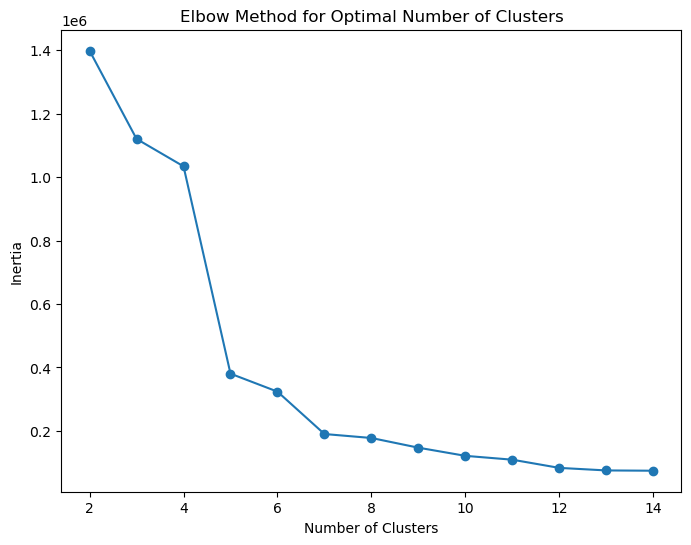

In [313]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(numbClusters, kmeans_inertias, marker='o')
ax.set_title('Elbow Method for Optimal Number of Clusters')
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Inertia')

In [314]:
#from https://www.geeksforgeeks.org/machine-learning/k-means-vs-k-means-clustering-algorithm/
#restarted here to print the convergence and the visualization of the clustering

class KMeans:
    def __init__(self, n_clusters, init='k-means++', max_iter=300, tol=0.0001, random_state=None):
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state
        self.iteration_data = []

    def kmeans_plus_plus_initialization(self):
        rng = np.random.RandomState(self.random_state)
        idx_mask = np.zeros(shape=self.X.shape[0]).astype('bool')
        data_idxs = np.arange(self.X.shape[0])
        idx = rng.choice(data_idxs)
        idx_mask[idx] = True
        for _ in range(1, self.n_clusters):
            min_centroid_dist = (np.linalg.norm(
                self.X[~idx_mask, np.newaxis, :] - self.X[np.newaxis, idx_mask, :],
                axis=-1
            )**2).min(axis=-1)
            centroid_prob = min_centroid_dist / min_centroid_dist.sum()
            idx = rng.choice(data_idxs[~idx_mask], p=centroid_prob)
            idx_mask[idx] = True
        return self.X[idx_mask]
    def initialization(self):
        if self.init == 'random':
            return self.random_initialization()
        elif self.init == 'k-means++':
            return self.kmeans_plus_plus_initialization()
    def visualize(self):
        n_plots = len(self.iteration_data)
        n_cols = 4
        n_rows = (n_plots + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))
        axes = axes.flatten()

        for i, data in enumerate(self.iteration_data):
            X, centroids, labels, itr = data
            cmap = mpl.colormaps['plasma']
            colors = cmap(np.linspace(0, 1, self.n_clusters))
            sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette=colors, ax=axes[i])
            axes[i].scatter(centroids[:, 0], centroids[:, 1], marker='o', color='grey', s=20)
            axes[i].set_title(f'Iteration: {itr}')

        for ax in axes[len(self.iteration_data):]:
            ax.remove()

        plt.tight_layout()
        plt.show()

    def fit(self, X):
        self.X = X.copy()
        self.cluster_centers_ = self.initialization()

        for itr in range(self.max_iter):
            old_cluster_centers = self.cluster_centers_.copy()

            centroid_dist = np.linalg.norm((self.X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
            self.labels_ = np.argmin(centroid_dist, axis=-1)

            self.inertia_ = 0
            for idx in range(self.n_clusters):
                self.cluster_centers_[idx] = self.X[self.labels_ == idx].mean(axis=0)
                self.inertia_ += ((self.X[self.labels_ == idx] - self.cluster_centers_[idx][np.newaxis, :])**2).sum()

            centroids_change = old_cluster_centers - self.cluster_centers_
            if np.linalg.norm(centroids_change, ord='fro') >= self.tol:
                self.iteration_data.append((self.X, old_cluster_centers, self.labels_, itr + 1))

            if np.linalg.norm(centroids_change, ord='fro') < self.tol:
                print(f"Converged after {itr} iterations")
                break

        self.labels_ = self.predict(self.X)
        self.visualize()

    def predict(self, X):
        centroid_dist = np.linalg.norm((X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
        labels = np.argmin(centroid_dist, axis=-1)
        return labels

# kmeans_plus_plus = KMeans(n_clusters=3, random_state=80)
# kmeans_plus_plus.fit(X)


Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



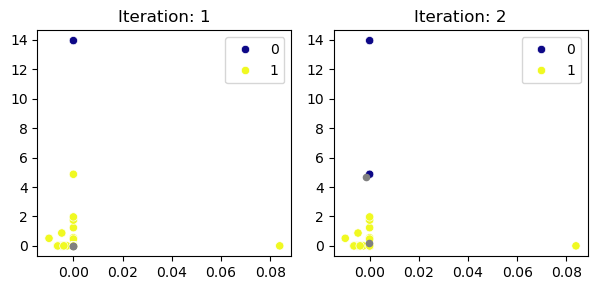

Converged after 1 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



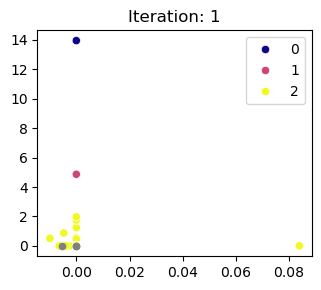

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



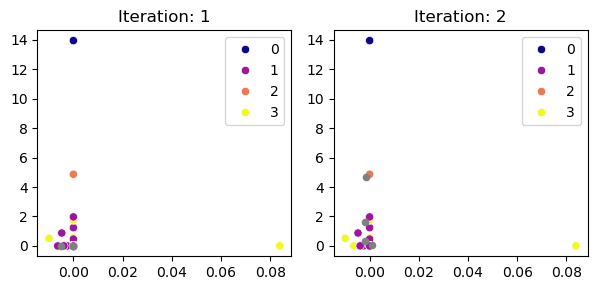

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



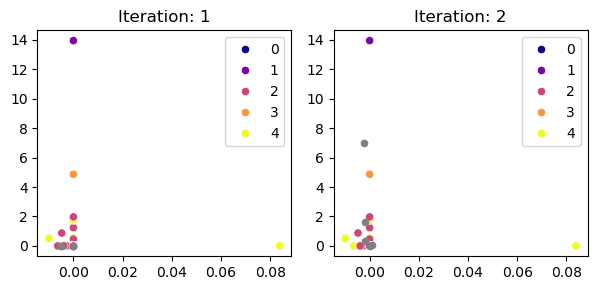

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



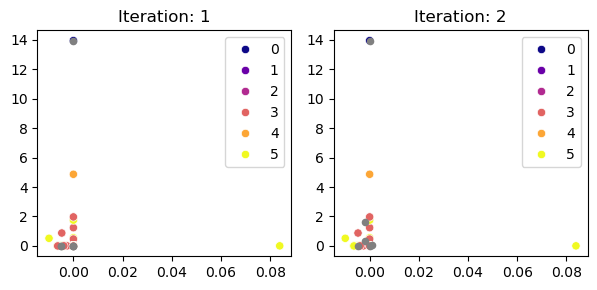

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



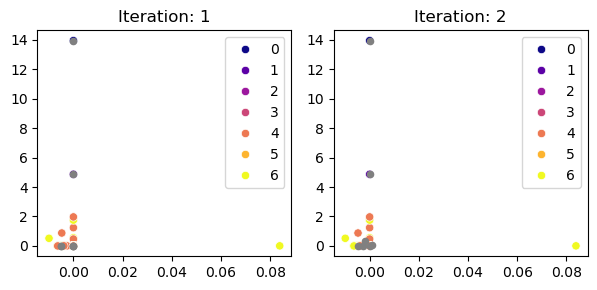

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



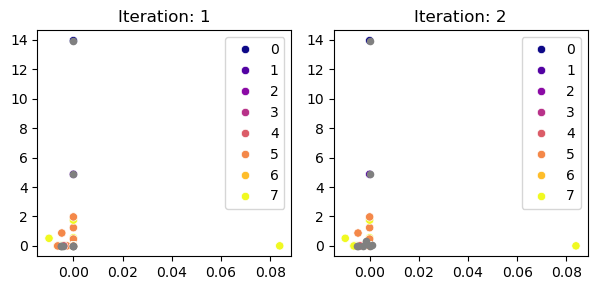

Converged after 3 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



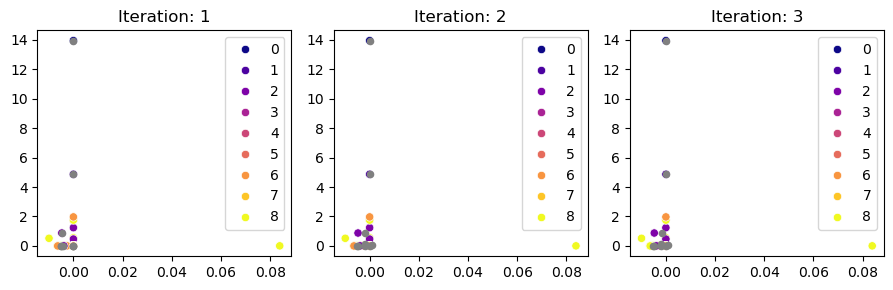

In [315]:
kmeans_inertias = []
numbClusters = range(2, 10)  # Adjust the range as needed

for numbCluster in numbClusters:
    kmeans = KMeans(n_clusters=numbCluster, random_state=0)
    kmeans.fit(X_train_df.values)
    kmeans_inertias.append(kmeans.inertia_)

## Kmeans

In [316]:
#from https://www.geeksforgeeks.org/machine-learning/k-means-vs-k-means-clustering-algorithm/
#restarted here to print the convergence and the visualization of the clustering

class KMeans:
    def __init__(self, n_clusters, init='k-means++', max_iter=300, tol=0.0001, random_state=None):
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state
        self.iteration_data = []

    def kmeans_plus_plus_initialization(self):
        rng = np.random.RandomState(self.random_state)
        idx_mask = np.zeros(shape=self.X.shape[0]).astype('bool')
        data_idxs = np.arange(self.X.shape[0])
        idx = rng.choice(data_idxs)
        idx_mask[idx] = True
        for _ in range(1, self.n_clusters):
            min_centroid_dist = (np.linalg.norm(
                self.X[~idx_mask, np.newaxis, :] - self.X[np.newaxis, idx_mask, :],
                axis=-1
            )**2).min(axis=-1)
            centroid_prob = min_centroid_dist / min_centroid_dist.sum()
            idx = rng.choice(data_idxs[~idx_mask], p=centroid_prob)
            idx_mask[idx] = True
        return self.X[idx_mask]
    def initialization(self):
        if self.init == 'random':
            return self.random_initialization()
        elif self.init == 'k-means++':
            return self.kmeans_plus_plus_initialization()
    def visualize(self):
        n_plots = len(self.iteration_data)
        n_cols = 4
        n_rows = (n_plots + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))
        axes = axes.flatten()

        for i, data in enumerate(self.iteration_data):
            X, centroids, labels, itr = data
            cmap = mpl.colormaps['plasma']
            colors = cmap(np.linspace(0, 1, self.n_clusters))
            sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette=colors, ax=axes[i])
            axes[i].scatter(centroids[:, 0], centroids[:, 1], marker='o', color='grey', s=20)
            axes[i].set_title(f'Iteration: {itr}')

        for ax in axes[len(self.iteration_data):]:
            ax.remove()

        plt.tight_layout()
        plt.show()

    def fit(self, X):
        self.X = X.copy()
        self.cluster_centers_ = self.initialization()

        for itr in range(self.max_iter):
            old_cluster_centers = self.cluster_centers_.copy()

            centroid_dist = np.linalg.norm((self.X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
            self.labels_ = np.argmin(centroid_dist, axis=-1)

            self.inertia_ = 0
            for idx in range(self.n_clusters):
                self.cluster_centers_[idx] = self.X[self.labels_ == idx].mean(axis=0)
                self.inertia_ += ((self.X[self.labels_ == idx] - self.cluster_centers_[idx][np.newaxis, :])**2).sum()

            centroids_change = old_cluster_centers - self.cluster_centers_
            if np.linalg.norm(centroids_change, ord='fro') >= self.tol:
                self.iteration_data.append((self.X, old_cluster_centers, self.labels_, itr + 1))

            if np.linalg.norm(centroids_change, ord='fro') < self.tol:
                print(f"Converged after {itr} iterations")
                break

        self.labels_ = self.predict(self.X)
        self.visualize()

    def predict(self, X):
        centroid_dist = np.linalg.norm((X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
        labels = np.argmin(centroid_dist, axis=-1)
        return labels

# kmeans_plus_plus = KMeans(n_clusters=3, random_state=80)
# kmeans_plus_plus.fit(X)


Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2404796999.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



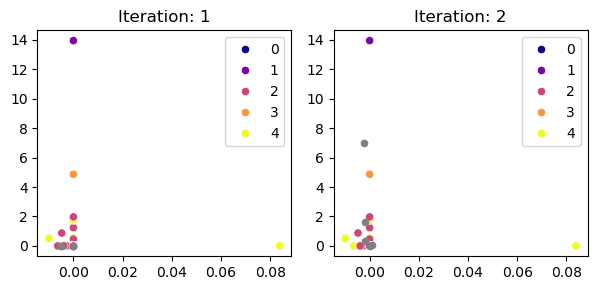

In [317]:
kmeans = KMeans(n_clusters=5, random_state=0)
kmeans.fit(X_train_df.values)

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Text(0.5, 1.0, 'UMAP Projection of KMeans Clustering')

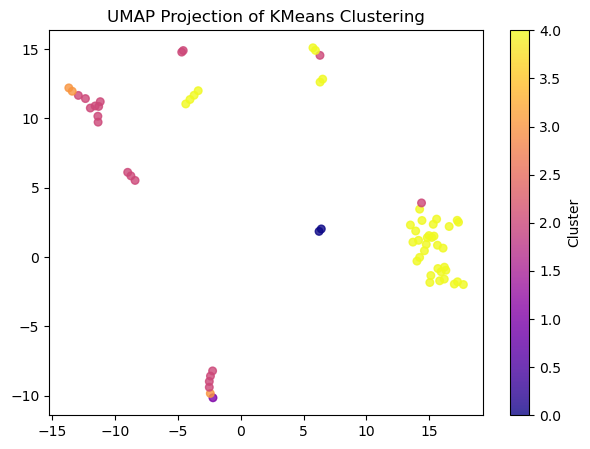

In [318]:
#umap projection after kmeans clustering
fig, ax = plt.subplots(figsize=(7, 5))
umap_embed = umap.UMAP(n_neighbors=2, min_dist=0.5, random_state=0)
X_umap = umap_embed.fit_transform(X_train_df.values)

cmap = mpl.colormaps['plasma']

scatter = ax.scatter(X_umap[:, 0], X_umap[:, 1], c=kmeans.predict(X_train_df.values), cmap=cmap, s=30, alpha=0.8)
plt.colorbar(scatter, label='Cluster')
ax.set_title('UMAP Projection of KMeans Clustering')


In [319]:
kmeans.predict(X_train_df.values)

array([4, 4, 4, 1, 3, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0,
       2, 4, 4, 4, 4, 3, 3, 4, 4, 4, 4, 2, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2,
       4, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 2, 2])

In [320]:
y_train_clustercomp = pd.DataFrame(kmeans.predict(X_train_df.values), columns=['Cluster'])

In [321]:
y_train_clustercomp['ptID'] = y_train_df
y_train_clustercomp['nsrv2_call'] = y_train_nsr
y_train_clustercomp['tms'] = y_train_tms
# y_train_clustercomp['met_1'] = y_train_mets['met_1']

In [322]:
kmeans_comparelables =pd.concat([y_train_clustercomp, y_train_mets], axis=1)
kmeans_comparelables

,Cluster,ptID,nsrv2_call,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,4,BTO-018,baseline,65.406292,0,2,0,0,0,0
1,4,BTO-018,no_change,50.954419,0,2,0,0,0,0
2,4,BTO-018,no_change,57.559948,0,2,0,0,0,0
3,1,BTO-022,baseline,65.406292,1,0,0,0,0,0
4,3,BTO-022,decrease,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
60,2,BTO-131,baseline,65.406292,1,2,0,4,5,0
61,4,BTO-131,decrease,50.954419,1,2,0,4,5,0
62,4,BTO-131,no_change,57.559948,1,2,0,4,5,0
63,2,BTO-134,baseline,65.406292,1,0,0,0,0,0


In [323]:
clusterExpand = pd.get_dummies(y_train_clustercomp['Cluster'], prefix='Cluster', drop_first=False)
clusterExpand

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4
0,False,False,False,False,True
1,False,False,False,False,True
2,False,False,False,False,True
3,False,True,False,False,False
4,False,False,False,True,False
...,...,...,...,...,...
60,False,False,True,False,False
61,False,False,False,False,True
62,False,False,False,False,True
63,False,False,True,False,False


In [324]:
heatmapdata = pd.concat((clusterExpand,pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False), y_train_tms, y_train_mets), axis=1)
heatmapdata

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,_BTO-018,_BTO-022,_BTO-035,_BTO-038,_BTO-042,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,False,False,False,False,True,True,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,False,False,False,False,True,True,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,False,False,False,False,True,True,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,False,True,False,False,False,False,True,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,False,False,False,True,False,False,True,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,True,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


In [325]:
#convert nominal data to numeric
from sklearn.preprocessing import LabelEncoder


nsr_nom = ['baseline', 'no_change', 'decrease', 'increase']
ptID_nom = list(y_train_df['ptID'].unique())

le = LabelEncoder()
heatmapdata_nom = heatmapdata
# heatmapdata_nom['nsrv2_call_nom'] = le.fit_transform(heatmapdata_nom['nsrv2_call'])
# heatmapdata_nom['ptID_nom'] = le.fit_transform(heatmapdata_nom['ptID'])
# heatmapdata_nom.drop(['ptID','nsrv2_call'], axis = 1, inplace = True)
heatmapdata_nom

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,_BTO-018,_BTO-022,_BTO-035,_BTO-038,_BTO-042,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,False,False,False,False,True,True,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,False,False,False,False,True,True,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,False,False,False,False,True,True,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,False,True,False,False,False,False,True,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,False,False,False,True,False,False,True,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,True,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


<Axes: >

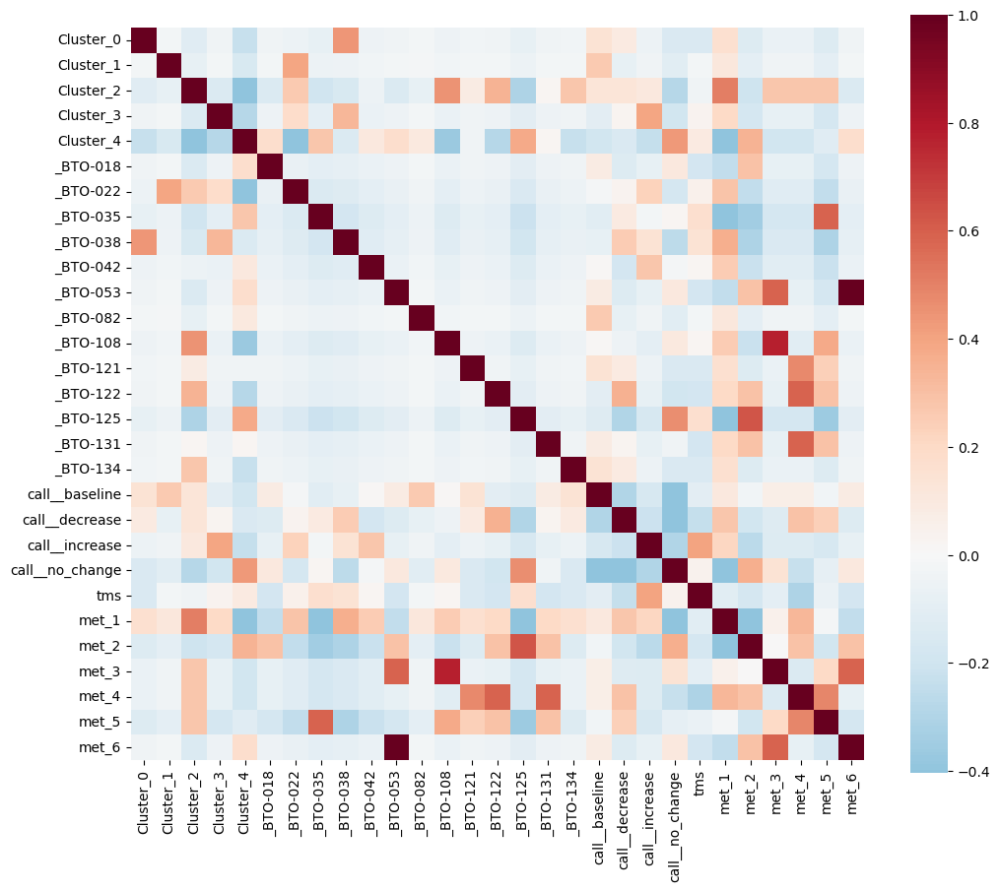

In [326]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(heatmapdata_nom.corr(method='spearman'), annot=False, cmap='RdBu_r', ax = ax, square = True, robust = True, center = 0)

In [327]:

labels_louvain = y_train_clustercomp['Cluster'].values

# 1.  DataFrame with cluster info
df = pd.DataFrame(X_train_df,
                columns=[f'loc{i}' for i in range(1, X_train_df.shape[1] + 1)])
df['cluster']  = labels_louvain
df['y_true']   = y_train_df

# 2.  Dictionary: cluster → sample indices
cluster_members = defaultdict(list)
for idx, cl in enumerate(labels_louvain):
    cluster_members[cl].append(idx)

# 3.  Sizes
cluster_counts = pd.Series(labels_louvain).value_counts().sort_index()

# 4.  Contingency table
contingency = pd.crosstab(labels_louvain, y_train.values.flatten(),
                        rownames=['Kmeans'], colnames=['True'])

# print("k and min distance: ", key)
print("Cluster sizes:", cluster_counts)
print("\nContingency table:\n", contingency)

Cluster sizes: 0     2
1     1
2    19
3     3
4    40
Name: count, dtype: int64

Contingency table:
 True    BTO-018  BTO-022  BTO-035  BTO-038  BTO-042  BTO-053  BTO-082  \
Kmeans                                                                  
0             0        0        0        2        0        0        0   
1             0        1        0        0        0        0        0   
2             0        4        1        1        1        0        0   
3             0        1        0        2        0        0        0   
4             3        0       10        4        4        3        1   

True    BTO-108  BTO-121  BTO-122  BTO-125  BTO-131  BTO-134  
Kmeans                                                        
0             0        0        0        0        0        0  
1             0        0        0        0        0        0  
2             5        1        3        0        1        2  
3             0        0        0        0        0        0  
4       

In [328]:

labels_louvain = y_train_clustercomp['Cluster'].values

# 1.  DataFrame with cluster info
df = pd.DataFrame(X_train_df,
                columns=[f'loc{i}' for i in range(1, X_train_df.shape[1] + 1)])
df['cluster']  = labels_louvain
df['y_true']   = y_train_nsr

# 2.  Dictionary: cluster → sample indices
cluster_members = defaultdict(list)
for idx, cl in enumerate(labels_louvain):
    cluster_members[cl].append(idx)

# 3.  Sizes
cluster_counts = pd.Series(labels_louvain).value_counts().sort_index()

# 4.  Contingency table
contingency = pd.crosstab(labels_louvain, y_train_nsr.values.flatten(),
                        rownames=['Kmeans'], colnames=['True'])

# print("k and min distance: ", key)
print("Cluster sizes:", cluster_counts)
print("\nContingency table:\n", contingency)

Cluster sizes: 0     2
1     1
2    19
3     3
4    40
Name: count, dtype: int64

Contingency table:
 True    baseline  decrease  increase  no_change
Kmeans                                         
0              1         1         0          0
1              1         0         0          0
2              5         7         3          4
3              0         1         2          0
4              5         9         2         24


# PCA

In [329]:
pca = PCA()
# y_train = datesIDnsr['ptID']
X_train_pca = pca.fit_transform(X_train)
explained_variance = pca.explained_variance_ratio_

<BarContainer object of 65 artists>

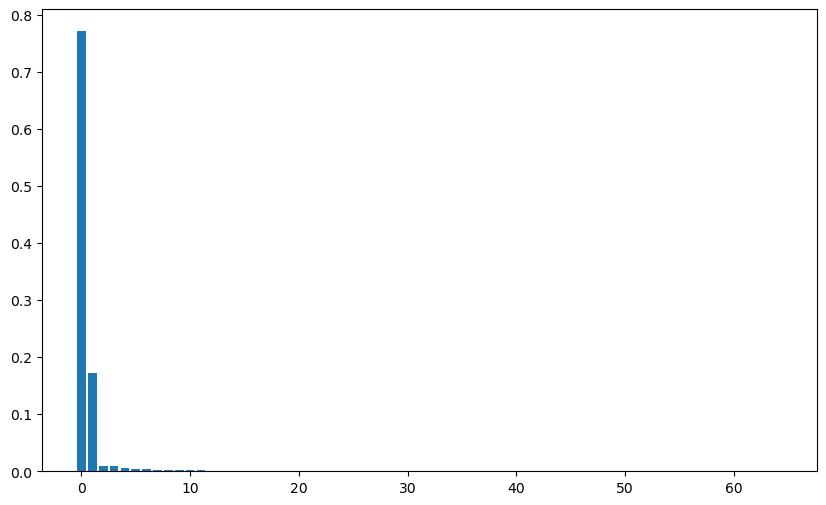

In [330]:
#elbow plot
fig, ax = plt.subplots(figsize = (10,6))

ax.bar(range(0,len(explained_variance),1),explained_variance)

In [331]:
pca = PCA(n_components=3)
y_train = datesIDnsr['ptID']
X_train_pca = pca.fit_transform(X_train)
explained_variance = pca.explained_variance_ratio_

<BarContainer object of 3 artists>

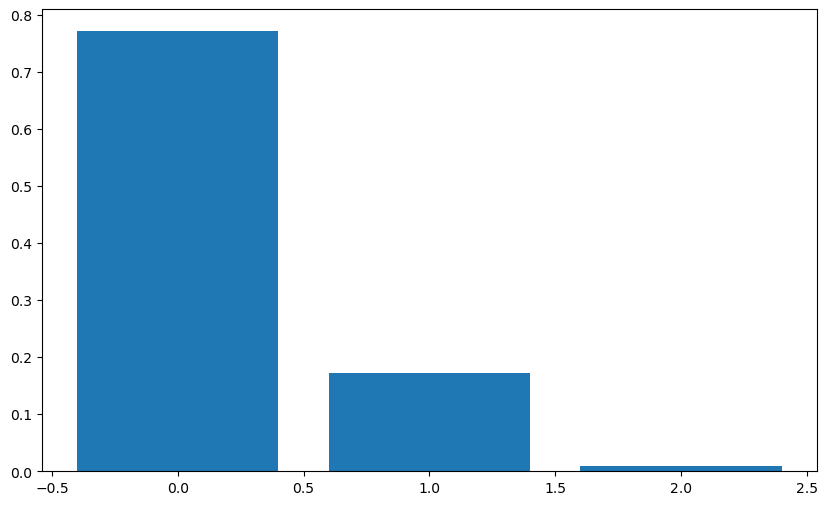

In [332]:
#elbow plot
fig, ax = plt.subplots(figsize = (10,6))

ax.bar(range(0,len(explained_variance),1),explained_variance)

# Kmeans Post PCA

In [333]:
#from https://www.geeksforgeeks.org/machine-learning/k-means-vs-k-means-clustering-algorithm/
#restarted here to print the convergence and the visualization of the clustering

class KMeans:
    def __init__(self, n_clusters, init='k-means++', max_iter=300, tol=0.0001, random_state=None):
        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state
        self.iteration_data = []

    def kmeans_plus_plus_initialization(self):
        rng = np.random.RandomState(self.random_state)
        idx_mask = np.zeros(shape=self.X.shape[0]).astype('bool')
        data_idxs = np.arange(self.X.shape[0])
        idx = rng.choice(data_idxs)
        idx_mask[idx] = True
        for _ in range(1, self.n_clusters):
            min_centroid_dist = (np.linalg.norm(
                self.X[~idx_mask, np.newaxis, :] - self.X[np.newaxis, idx_mask, :],
                axis=-1
            )**2).min(axis=-1)
            centroid_prob = min_centroid_dist / min_centroid_dist.sum()
            idx = rng.choice(data_idxs[~idx_mask], p=centroid_prob)
            idx_mask[idx] = True
        return self.X[idx_mask]
    def initialization(self):
        if self.init == 'random':
            return self.random_initialization()
        elif self.init == 'k-means++':
            return self.kmeans_plus_plus_initialization()
    def visualize(self):
        n_plots = len(self.iteration_data)
        n_cols = 4
        n_rows = (n_plots + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))
        axes = axes.flatten()

        for i, data in enumerate(self.iteration_data):
            X, centroids, labels, itr = data
            cmap = mpl.colormaps['plasma']
            colors = cmap(np.linspace(0, 1, self.n_clusters))
            sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette=colors, ax=axes[i])
            axes[i].scatter(centroids[:, 0], centroids[:, 1], marker='*', color='grey', s=20)
            axes[i].set_title(f'Iteration: {itr}')

        for ax in axes[len(self.iteration_data):]:
            ax.remove()

        plt.tight_layout()
        plt.show()

    def fit(self, X):
        self.X = X.copy()
        self.cluster_centers_ = self.initialization()

        for itr in range(self.max_iter):
            old_cluster_centers = self.cluster_centers_.copy()

            centroid_dist = np.linalg.norm((self.X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
            self.labels_ = np.argmin(centroid_dist, axis=-1)

            self.inertia_ = 0
            for idx in range(self.n_clusters):
                self.cluster_centers_[idx] = self.X[self.labels_ == idx].mean(axis=0)
                self.inertia_ += ((self.X[self.labels_ == idx] - self.cluster_centers_[idx][np.newaxis, :])**2).sum()

            centroids_change = old_cluster_centers - self.cluster_centers_
            if np.linalg.norm(centroids_change, ord='fro') >= self.tol:
                self.iteration_data.append((self.X, old_cluster_centers, self.labels_, itr + 1))

            if np.linalg.norm(centroids_change, ord='fro') < self.tol:
                print(f"Converged after {itr} iterations")
                break

        self.labels_ = self.predict(self.X)
        self.visualize()

    def predict(self, X):
        centroid_dist = np.linalg.norm((X[:, np.newaxis, :] - self.cluster_centers_[np.newaxis, :, :]), axis=-1)
        labels = np.argmin(centroid_dist, axis=-1)
        return labels

# kmeans_plus_plus = KMeans(n_clusters=3, random_state=80)
# kmeans_plus_plus.fit(X)


Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



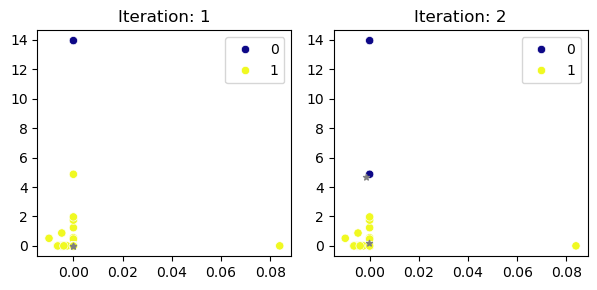

Converged after 1 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



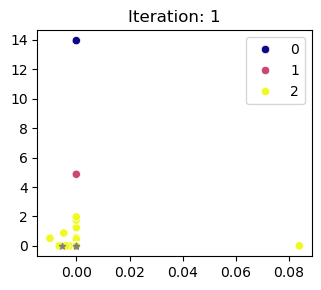

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



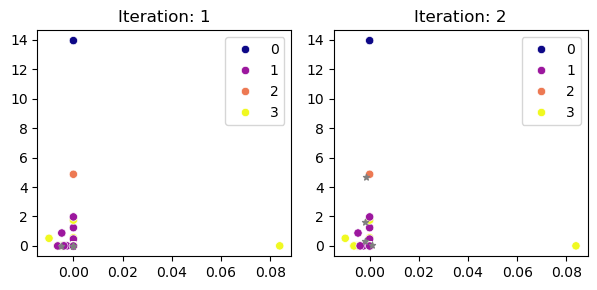

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



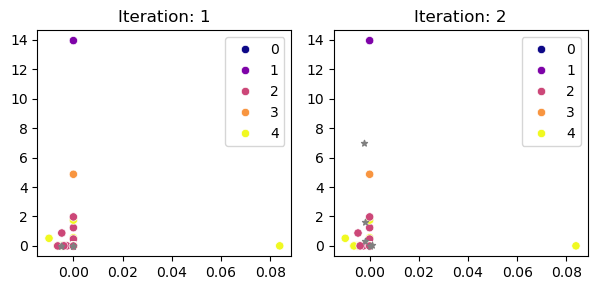

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



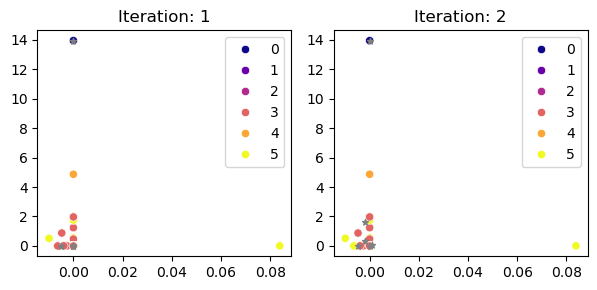

Converged after 2 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14

C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



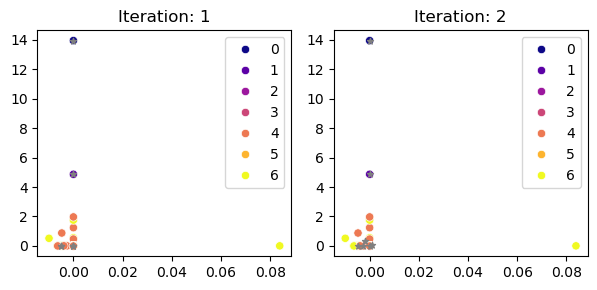

In [334]:
kmeans_inertias = []
numbClusters = range(2, 8)  # Adjust the range as needed

for numbCluster in numbClusters:
    kmeans = KMeans(n_clusters=numbCluster, random_state=0)
    kmeans.fit(X_train_df.values)
    kmeans_inertias.append(kmeans.inertia_)

Text(0, 0.5, 'Inertia')

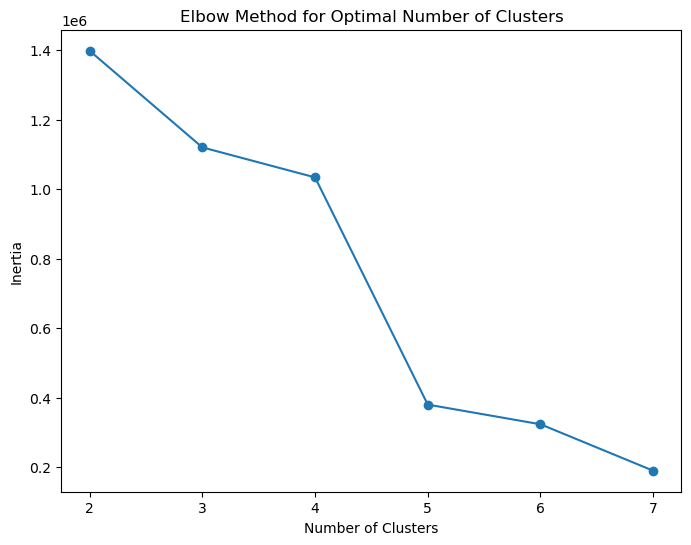

In [335]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(numbClusters, kmeans_inertias, marker='o')
ax.set_title('Elbow Method for Optimal Number of Clusters')
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Inertia')

Converged after 1 iterations


C:\Users\maega\AppData\Local\Temp\ipykernel_47060\2452265574.py:45: UserWarning:

Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14



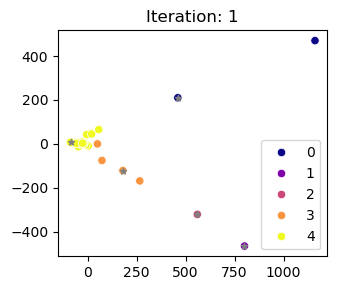

In [336]:
kmeans_pca = KMeans(n_clusters=5, random_state=0)
kmeans_pca.fit(X_train_pca)

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Text(0.5, 1.0, 'UMAP Projection of KMeans Clustering on PCA-Reduced Data')

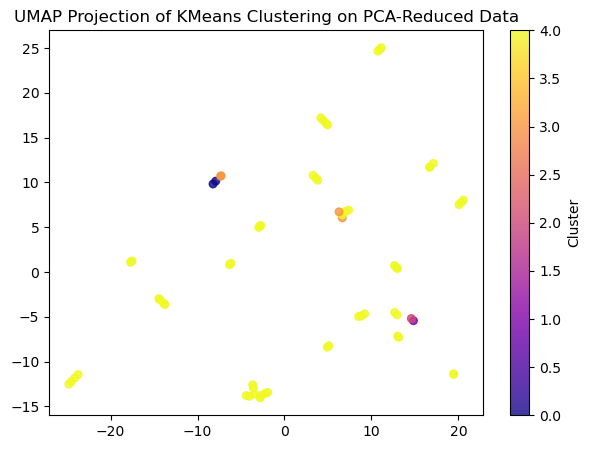

In [337]:
#umap projection after kmeans clustering
fig, ax = plt.subplots(figsize=(7, 5))
umap_embed = umap.UMAP(n_neighbors=2, min_dist=0.5, random_state=0)
X_pca_umap = umap_embed.fit_transform(X_train_pca)

cmap = mpl.colormaps['plasma']

scatter = ax.scatter(X_pca_umap[:, 0], X_pca_umap[:, 1], c=kmeans_pca.predict(X_train_pca), cmap=cmap, s=30, alpha=0.8)
plt.colorbar(scatter, label='Cluster')
ax.set_title('UMAP Projection of KMeans Clustering on PCA-Reduced Data')


In [338]:
#cluster label and other label relationships

In [339]:
y_train_pca_clustercomp = pd.DataFrame(kmeans_pca.predict(X_train_pca), columns=['Cluster'])

clusterExpand_pca = pd.get_dummies(y_train_pca_clustercomp['Cluster'], prefix='Cluster', drop_first=False)
clusterExpand_pca

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4
0,False,False,False,False,True
1,False,False,False,False,True
2,False,False,False,False,True
3,True,False,False,False,False
4,True,False,False,False,False
...,...,...,...,...,...
60,False,False,False,False,True
61,False,False,False,False,True
62,False,False,False,False,True
63,False,False,False,True,False


In [340]:
pd.concat([y_train_pca_clustercomp, y_train_df, y_train_nsr, y_train_tms, y_train_mets], axis=1)

,Cluster,ptID,nsrv2_call,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,4,BTO-018,baseline,65.406292,0,2,0,0,0,0
1,4,BTO-018,no_change,50.954419,0,2,0,0,0,0
2,4,BTO-018,no_change,57.559948,0,2,0,0,0,0
3,0,BTO-022,baseline,65.406292,1,0,0,0,0,0
4,0,BTO-022,decrease,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
60,4,BTO-131,baseline,65.406292,1,2,0,4,5,0
61,4,BTO-131,decrease,50.954419,1,2,0,4,5,0
62,4,BTO-131,no_change,57.559948,1,2,0,4,5,0
63,3,BTO-134,baseline,65.406292,1,0,0,0,0,0


In [341]:
heatmapdata_pca = pd.concat((clusterExpand_pca, pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False), y_train_tms, y_train_mets), axis=1)
heatmapdata_pca

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,_BTO-018,_BTO-022,_BTO-035,_BTO-038,_BTO-042,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,False,False,False,False,True,True,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,False,False,False,False,True,True,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,False,False,False,False,True,True,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,True,False,False,False,False,False,True,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,True,False,False,False,False,False,True,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,False,False,True,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,True,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,False,True,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


In [342]:
#convert nominal data to numeric
from sklearn.preprocessing import LabelEncoder


nsr_nom = ['baseline', 'no_change', 'decrease', 'increase']
ptID_nom = list(y_train_df['ptID'].unique())

le = LabelEncoder()
heatmapdata_pca_nom = heatmapdata_pca
# heatmapdata_pca_nom['nsrv2_call_nom'] = le.fit_transform(heatmapdata_pca_nom['nsrv2_call'])
# heatmapdata_pca_nom['ptID_nom'] = le.fit_transform(heatmapdata_pca_nom['ptID'])
# heatmapdata_pca_nom.drop(['ptID','nsrv2_call'], axis = 1, inplace = True)
heatmapdata_pca_nom

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,_BTO-018,_BTO-022,_BTO-035,_BTO-038,_BTO-042,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,False,False,False,False,True,True,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,False,False,False,False,True,True,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,False,False,False,False,True,True,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,True,False,False,False,False,False,True,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,True,False,False,False,False,False,True,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,False,False,True,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,True,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,False,True,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


<Axes: >

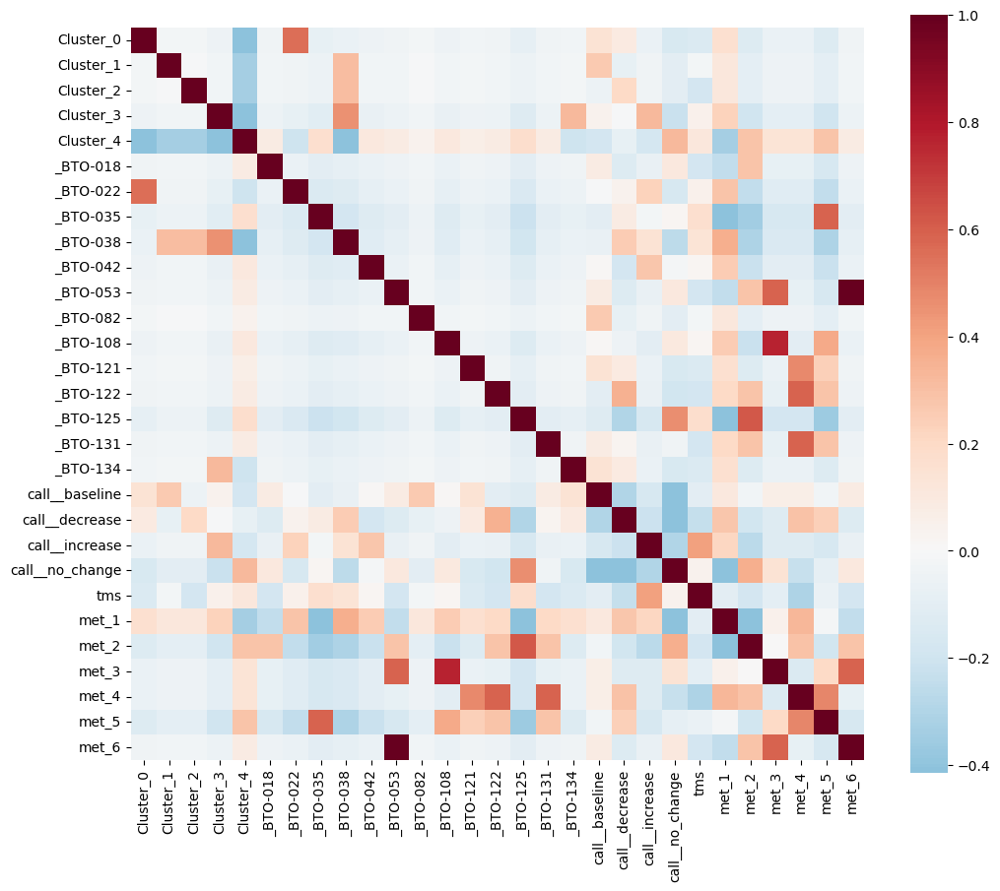

In [343]:
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(heatmapdata_pca_nom.corr(method='spearman'), annot=False, cmap='RdBu_r', ax = ax, square = True, robust = True, center = 0)

In [344]:

labels_louvain = y_train_pca_clustercomp['Cluster'].values

# 1.  DataFrame with cluster info
df = pd.DataFrame(X_train_df,
                columns=[f'loc{i}' for i in range(1, X_train_df.shape[1] + 1)])
df['cluster']  = labels_louvain
df['y_true']   = y_train_nsr

# 2.  Dictionary: cluster → sample indices
cluster_members = defaultdict(list)
for idx, cl in enumerate(labels_louvain):
    cluster_members[cl].append(idx)

# 3.  Sizes
cluster_counts = pd.Series(labels_louvain).value_counts().sort_index()

# 4.  Contingency table
contingency = pd.crosstab(labels_louvain, y_train_nsr.values.flatten(),
                        rownames=['Kmeans'], colnames=['True'])

# print("k and min distance: ", key)
print("Cluster sizes:", cluster_counts)
print("\nContingency table:\n", contingency)

Cluster sizes: 0     2
1     1
2     1
3     4
4    57
Name: count, dtype: int64

Contingency table:
 True    baseline  decrease  increase  no_change
Kmeans                                         
0              1         1         0          0
1              1         0         0          0
2              0         1         0          0
3              1         1         2          0
4              9        15         5         28


In [345]:

labels_louvain = y_train_pca_clustercomp['Cluster'].values

# 1.  DataFrame with cluster info
df = pd.DataFrame(X_train_df,
                columns=[f'loc{i}' for i in range(1, X_train_df.shape[1] + 1)])
df['cluster']  = labels_louvain
df['y_true']   = y_train_df

# 2.  Dictionary: cluster → sample indices
cluster_members = defaultdict(list)
for idx, cl in enumerate(labels_louvain):
    cluster_members[cl].append(idx)

# 3.  Sizes
cluster_counts = pd.Series(labels_louvain).value_counts().sort_index()

# 4.  Contingency table
contingency = pd.crosstab(labels_louvain, y_train_df.values.flatten(),
                        rownames=['Kmeans'], colnames=['True'])

# print("k and min distance: ", key)
print("Cluster sizes:", cluster_counts)
print("\nContingency table:\n", contingency)

Cluster sizes: 0     2
1     1
2     1
3     4
4    57
Name: count, dtype: int64

Contingency table:
 True    BTO-018  BTO-022  BTO-035  BTO-038  BTO-042  BTO-053  BTO-082  \
Kmeans                                                                  
0             0        2        0        0        0        0        0   
1             0        0        0        1        0        0        0   
2             0        0        0        1        0        0        0   
3             0        0        0        3        0        0        0   
4             3        4       11        4        5        3        1   

True    BTO-108  BTO-121  BTO-122  BTO-125  BTO-131  BTO-134  
Kmeans                                                        
0             0        0        0        0        0        0  
1             0        0        0        0        0        0  
2             0        0        0        0        0        0  
3             0        0        0        0        0        1  
4       

# manifold clustering

In [346]:
from sklearn import manifold

In [347]:
isomap = manifold.Isomap(n_neighbors=7, n_components=7)
X_isomap = isomap.fit_transform(X_train)

In [348]:
X_isomap.shape

(65, 7)

In [349]:
# #umap projection after kmeans clustering
# fig, ax = plt.subplots(figsize=(7, 5))
# umap_embed = umap.UMAP(n_neighbors=2, min_dist=0.5, random_state=0)
# X_iso_umap = umap_embed.fit_transform(X_isomap)

# cmap = mpl.colormaps['plasma']

# scatter = ax.scatter(X_iso_umap[:, 0], X_iso_umap[:, 1], cmap = cmap, c= X_isomap, s=30, alpha=0.8)
# plt.colorbar(scatter, label='Cluster')
# ax.set_title('UMAP Projection of KMeans Clustering on Isomap-Reduced Data')

# categorical NB

In [350]:
from sklearn.naive_bayes import GaussianNB, CategoricalNB, MultinomialNB
clf= GaussianNB()
clf.fit(X_train_df, y_train_nsr)
clf.classes_

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\utils\validation.py:1406: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



array(['baseline', 'decrease', 'increase', 'no_change'], dtype='<U9')

# bayesian gaussian mixture

In [351]:
from sklearn.mixture import BayesianGaussianMixture
bgm = BayesianGaussianMixture(n_components=7, random_state=0).fit_predict(X_train_df)
bgm

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



array([0, 0, 0, 2, 5, 6, 6, 6, 3, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       6, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6,
       0, 6, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 3, 6])

In [352]:
numb_components = range(2, 20)  # Adjust the range as needed
score_list = []
bayes_score_dict = {}
class_labels_dict = {}

for numbComponent in numb_components:
    bgm = BayesianGaussianMixture(n_components=numbComponent, random_state=0).fit(X_train_df)
    # score_list.append(bgm.score(X_train_df))
    # bayes_score_dict[numbComponent] = bgm.score_samples(X_train_df)
    class_labels_dict[numbComponent] = bgm.predict(X_train_df)
    # print(f"Number of Components: {numbComponent}, BIC: {bgm.bic(X_train_df)}")

# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(numb_components, score_list, marker='o')
# ax.set_title('Elbow Method for number of components in Bayesian Gaussian Mixture')
# ax.set_xlabel('Number of Components')
# ax.set_ylabel('score')

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known

In [353]:
class_labels_dict[6]

array([0, 0, 0, 2, 5, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       3, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 0, 0, 3,
       0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3])

## plots

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



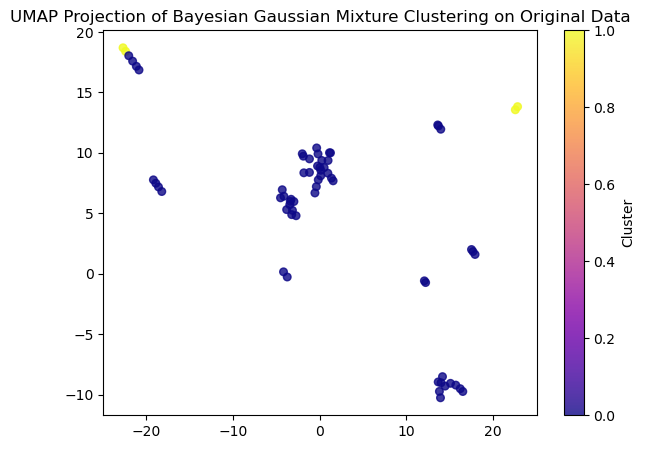

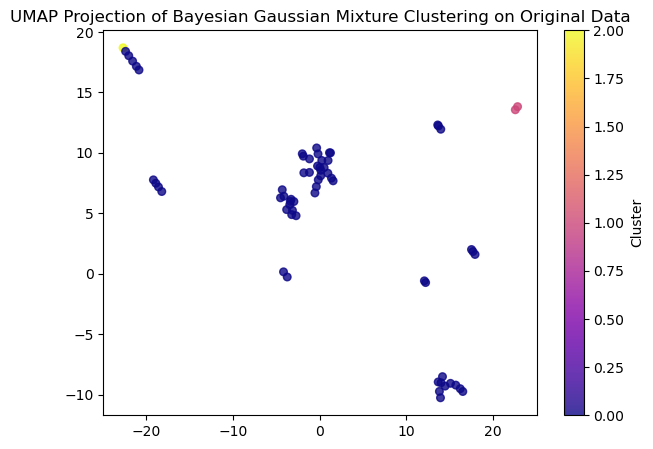

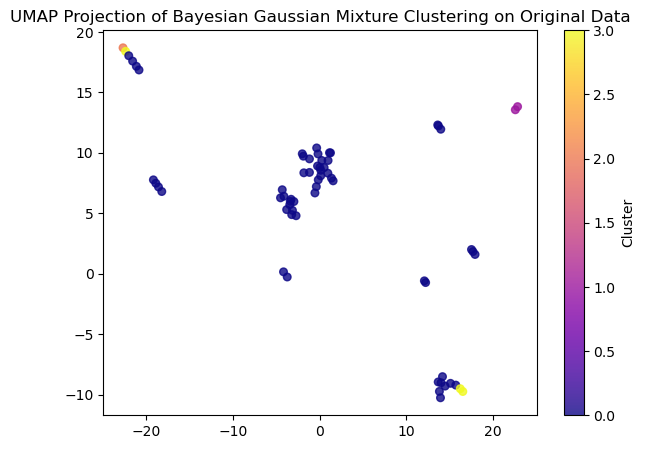

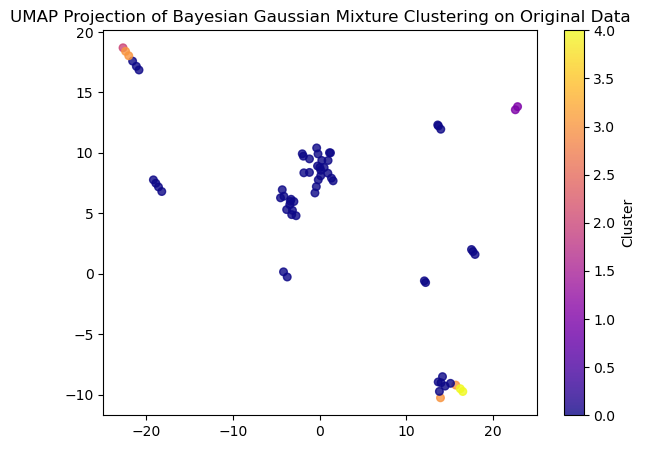

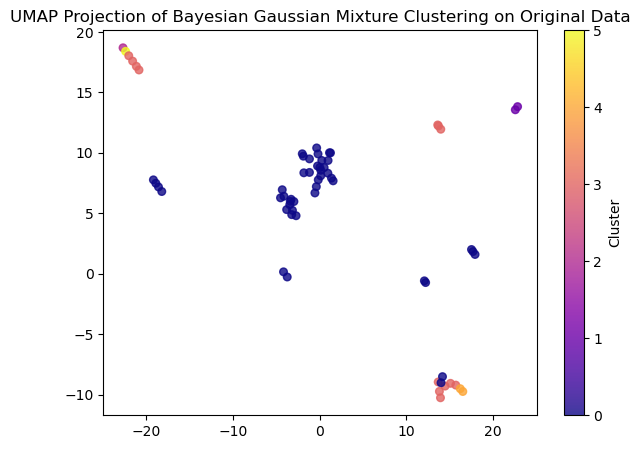

...

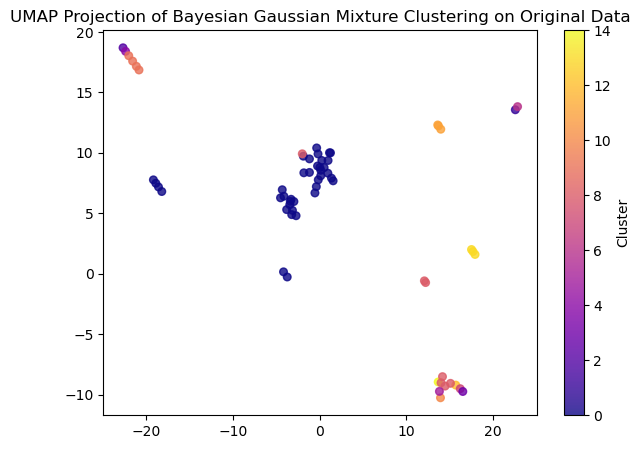

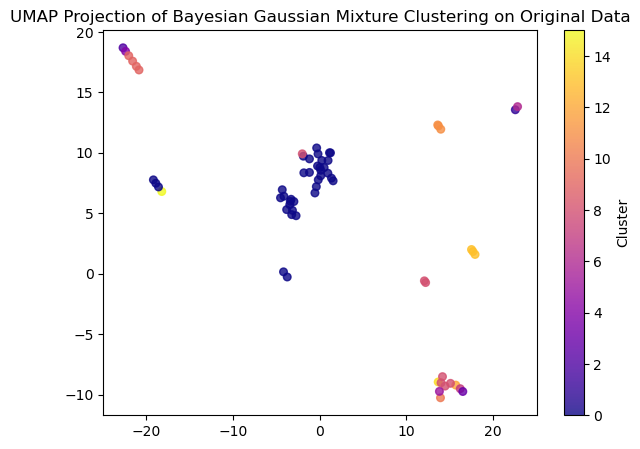

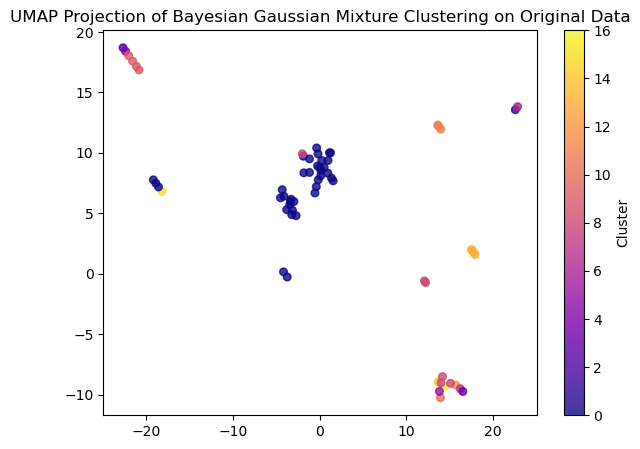

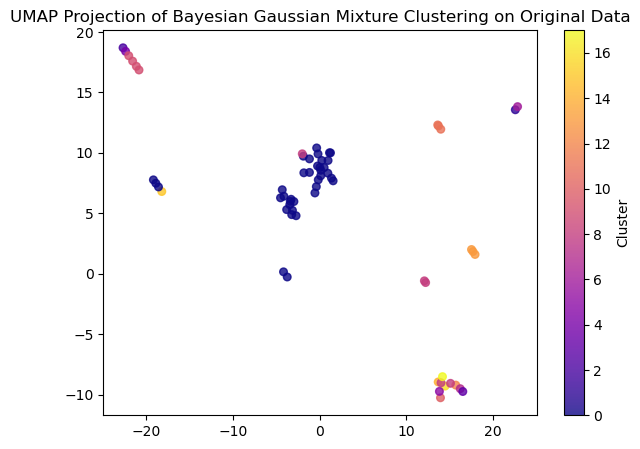

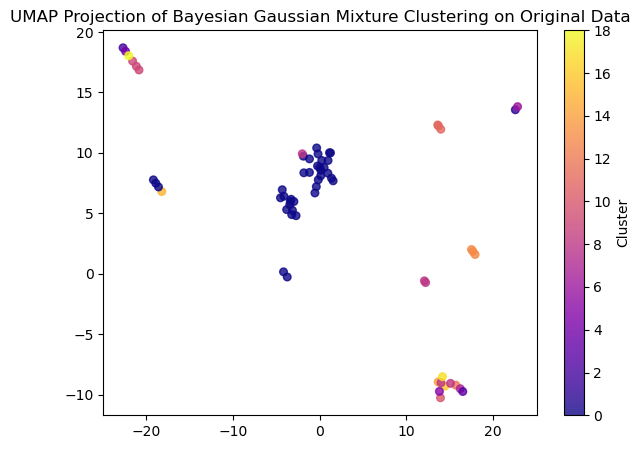

In [354]:

umap_embed = umap.UMAP(n_neighbors=2, min_dist=0.5, random_state=0)
X_bay_umap = umap_embed.fit_transform(X_train_df)

cmap = mpl.colormaps['plasma']

for numbComponent in class_labels_dict.keys():
    fig, ax = plt.subplots(figsize=(7, 5))
    scatter = ax.scatter(X_bay_umap[:, 0], X_bay_umap[:, 1], c=class_labels_dict[numbComponent], cmap=cmap, s=30, alpha=0.8)
    plt.colorbar(scatter, label='Cluster')
    ax.set_title('UMAP Projection of Bayesian Gaussian Mixture Clustering on Original Data')

In [355]:
import plotly.express as px

In [356]:
k = 6
min_dist_val = 0.1
labels_louvain = class_labels_dict[k]

umap_embed = umap.UMAP(n_neighbors=2, min_dist=0.5, random_state=0)
X_umap = umap_embed.fit_transform(X_train_df)

fig_louvain = px.scatter(
    X_umap, x = 0, y = 1, color = labels_louvain,
    width = 700, height = 500, title= 'UMAP colored by Bayesian Gaussian Mixture Clustering (k={})'.format(k)
)
# scatter = ax.scatter(X_umap[:, 0], X_umap[:, 1],
#         c=labels_louvain, cmap='tab10', s=30, alpha=0.8)
# plt.colorbar(scatter, label='Cluster')
# ax.set_xticks([])
# ax.set_yticks([])
# fig_louvain.update_layout(width = 700, height = 500)
fig_louvain.show()

fig_nsr = px.scatter(
    X_umap, x = 0, y = 1, color = y_train_nsr['nsrv2_call'],
    width = 700, height = 500, title = 'UMAP colored by NSRv2 calls'   
)

fig_ptID = px.scatter(
    X_umap, x = 0, y = 1, color = y_train_df['ptID'],
    width = 700, height = 500, title = 'UMAP colored by patient ID'
)
fig_TMS = px.scatter(
    X_umap, x = 0, y = 1, color = y_train_tms['tms'],
    width = 700, height = 500, title = 'UMAP colored by TMS values'
)


fig_nsr.show()
fig_ptID.show()
fig_TMS.show()

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



In [357]:
# colored by met site. the color will only reflect one met site at a time, some patients may have multiple met sites and thus appear colored in multiple graphs
for column in y_train_mets.columns:
    
    fig_met = px.scatter(
        X_umap, x = 0, y = 1, color = y_train_mets[column],
        width = 700, height = 500, title = 'UMAP colored by ' + column)
    fig_met.show()

## correlation

In [358]:
#encode the cluster labels and check them in a spearmans correlation heatmap against other class labels

In [359]:
numbComponent = 15

In [360]:
y_train_clustercomp = pd.DataFrame(class_labels_dict[numbComponent], columns=['Cluster'])

In [361]:
clusterExpand = pd.get_dummies(y_train_clustercomp['Cluster'], prefix='Cluster', drop_first=False)
clusterExpand

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14
0,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
61,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
62,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
63,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [362]:
nsrv2_dummies = pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='nsrv2_call', drop_first=False)
nsrv2_dummies

,nsrv2_call_baseline,nsrv2_call_decrease,nsrv2_call_increase,nsrv2_call_no_change
0,True,False,False,False
1,False,False,False,True
2,False,False,False,True
3,True,False,False,False
4,False,True,False,False
...,...,...,...,...
60,True,False,False,False
61,False,True,False,False
62,False,False,False,True
63,True,False,False,False


In [363]:
y_train_clustercomp['ptID'] = y_train_df
y_train_clustercomp['nsrv2_call'] = y_train_nsr
y_train_clustercomp['tms'] = y_train_tms
pd.concat([y_train_clustercomp, y_train_mets], axis=1)

,Cluster,ptID,nsrv2_call,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,0,BTO-018,baseline,65.406292,0,2,0,0,0,0
1,0,BTO-018,no_change,50.954419,0,2,0,0,0,0
2,0,BTO-018,no_change,57.559948,0,2,0,0,0,0
3,2,BTO-022,baseline,65.406292,1,0,0,0,0,0
4,4,BTO-022,decrease,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
60,13,BTO-131,baseline,65.406292,1,2,0,4,5,0
61,13,BTO-131,decrease,50.954419,1,2,0,4,5,0
62,13,BTO-131,no_change,57.559948,1,2,0,4,5,0
63,10,BTO-134,baseline,65.406292,1,0,0,0,0,0


In [364]:
# heatmapdata = pd.concat([clusterExpand, y_train_df, y_train_nsr, y_train_tms, y_train_mets], axis=1)
# heatmapdata


In [365]:

heatmapdata = pd.concat((clusterExpand, pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False), y_train_tms, y_train_mets), axis=1)
heatmapdata


,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,True,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,True,False,False,False,False,False,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,True,False,False,False,False,False,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,False,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,False,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


In [366]:
#convert nominal data to numeric
from sklearn.preprocessing import LabelEncoder

nsr_nom = ['baseline', 'no_change', 'decrease', 'increase']
ptID_nom = list(y_train_df['ptID'].unique())
le = LabelEncoder()
heatmapdata_nom = heatmapdata
# # heatmapdata_nom['nsrv2_call_nom'] = le.fit_transform(heatmapdata_nom['nsrv2_call'])
# heatmapdata_nom['ptID_nom'] = le.fit_transform(heatmapdata_nom['ptID'])
# # heatmapdata_nom.drop(['ptID','nsrv2_call'], axis = 1, inplace = True)
# heatmapdata_nom.drop(['ptID'], axis = 1, inplace = True)

heatmapdata_nom



,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,...,call__decrease,call__increase,call__no_change,tms,met_1,met_2,met_3,met_4,met_5,met_6
0,True,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,0,2,0,0,0,0
1,True,False,False,False,False,False,False,False,False,False,...,False,False,True,50.954419,0,2,0,0,0,0
2,True,False,False,False,False,False,False,False,False,False,...,False,False,True,57.559948,0,2,0,0,0,0
3,False,False,True,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0
4,False,False,False,False,True,False,False,False,False,False,...,True,False,False,50.954419,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,False,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,2,0,4,5,0
61,False,False,False,False,False,False,False,False,False,False,...,True,False,False,50.954419,1,2,0,4,5,0
62,False,False,False,False,False,False,False,False,False,False,...,False,False,True,57.559948,1,2,0,4,5,0
63,False,False,False,False,False,False,False,False,False,False,...,False,False,False,65.406292,1,0,0,0,0,0


<Axes: >

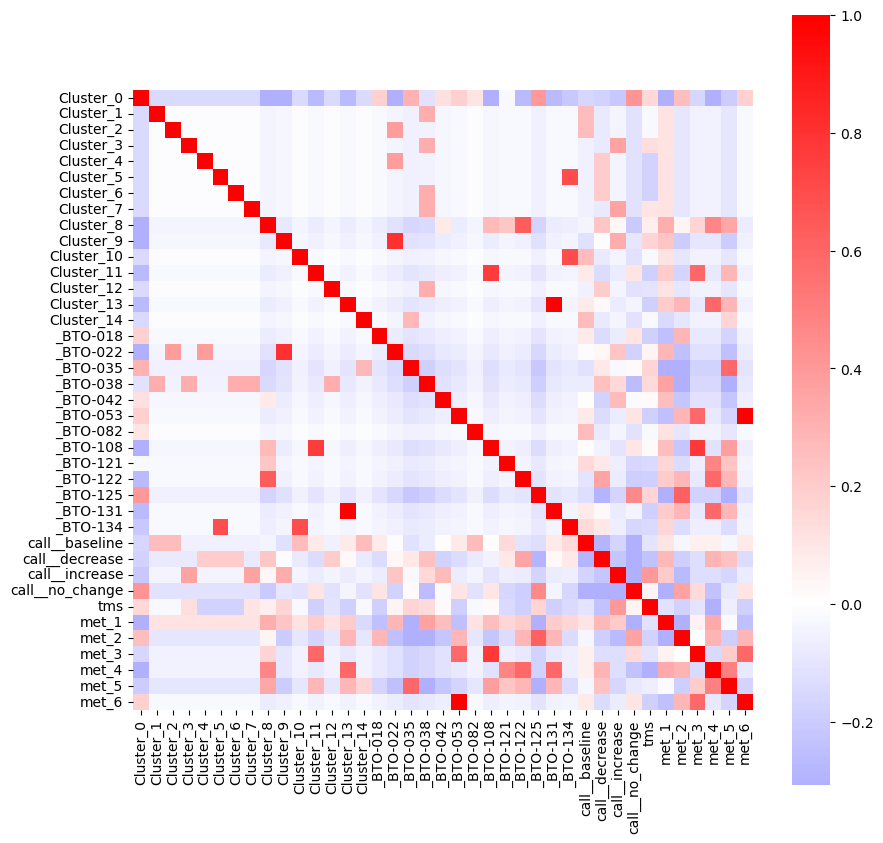

In [367]:

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(heatmapdata_nom.corr(method='spearman'), annot=False, cmap='bwr', ax = ax, square = True, robust = True, center = 0)
